# NYC Taxi Trip Duration Analysis Notebook

This notebook is part of the NYC Taxi Trip Duration project, which aims to analyze and predict the duration of taxi trips in New York City. The project uses a dataset containing detailed information about taxi trips, including pickup and dropoff locations, trip durations, and other relevant trip details. 



In [142]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import folium
import plotly.express as px

In [143]:
# Helper functions
def put_text_on_barplot(ax, values):
    for i, value in enumerate(values):
        ax.text(i, value, value, ha='center')
    


# NYC Taxi Trip Duration Dataset Overview

NYC Taxi Trip Duration: This is the primary dataset that contains detailed information about taxi trips in New York City, including pickup and dropoff locations, trip durations, and other relevant trip details.

In [144]:
nyc = pd.read_csv('../datasets/nyc.csv')

## Exploring the NYC Taxi Trip Duration Dataset

In [145]:
nyc.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [146]:
nyc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1458644 non-null  object 
 1   vendor_id           1458644 non-null  int64  
 2   pickup_datetime     1458644 non-null  object 
 3   dropoff_datetime    1458644 non-null  object 
 4   passenger_count     1458644 non-null  int64  
 5   pickup_longitude    1458644 non-null  float64
 6   pickup_latitude     1458644 non-null  float64
 7   dropoff_longitude   1458644 non-null  float64
 8   dropoff_latitude    1458644 non-null  float64
 9   store_and_fwd_flag  1458644 non-null  object 
 10  trip_duration       1458644 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 122.4+ MB


The basic dataset contains the following columns:
- id: A unique identifier for each trip.
- vendor_id: A code indicating the provider associated with the trip record.
- pickup_datetime: The date and time when the meter was engaged.
- dropoff_datetime: The date and time when the meter was disengaged.
- passenger_count: The number of passengers in the vehicle.
- pickup_longitude: The longitude where the meter was engaged.
- pickup_latitude: The latitude where the meter was engaged.
- dropoff_longitude: The longitude where the meter was disengaged.
- dropoff_latitude: The latitude where the meter was disengaged.
- store_and_fwd_flag: This flag indicates whether the trip record was held in vehicle memory before sending it to the vendor.
- trip_duration: Duration of the trip in seconds - The is our target variable.

### Adding basic features to the dataset

We will add the following features:
- Pickup day of the week. (Monday, Tuesday, Wednesday, Thursday, Friday, Saturday, Sunday)
- Month of the trip. (January, February, March, April, May, June)
- Pickup and dropoff hour, and pickup hour in minutes.
- Pickup day of week in number.
- Date of the trip.
- Frequency of trips per hour and per day of the week.
- store_and_fwd_flag - at the moment it is a string, we will convert it to a boolean.

These features will be used for EDA and further analysis, and they will help us better understand the distribution of trips across hours, days, and months.

In [150]:
nyc['pickup_datetime'] = pd.to_datetime(nyc['pickup_datetime'])
nyc['pickup_date'] = nyc['pickup_datetime'].dt.date
# Day of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
nyc['pickup_day_of_week'] = pd.to_datetime(nyc['pickup_datetime']).dt.day_name()
nyc['pickup_day_of_week'] = pd.Categorical(nyc['pickup_day_of_week'], categories=day_order, ordered=True)
nyc['pickup_day_of_week_num'] = pd.to_datetime(nyc['pickup_datetime']).dt.dayofweek

# Month
month_order = ['January', 'February', 'March', 'April', 'May', 'June']
nyc['month'] = pd.to_datetime(nyc['pickup_datetime']).dt.month_name()
nyc['month'] = pd.Categorical(nyc['month'], categories=month_order, ordered=True)
nyc['day_of_year'] = pd.to_datetime(nyc['pickup_datetime']).dt.dayofyear

nyc['pickup_hour'] = pd.to_datetime(nyc['pickup_datetime']).dt.hour
nyc['pickup_hour_in_minutes'] = pd.to_datetime(nyc['pickup_datetime']).dt.hour*60 + pd.to_datetime(nyc['pickup_datetime']).dt.minute

hourly_pickup_frequency = nyc.groupby('pickup_hour').size().reset_index(name='hourly_pickup_frequency')
daily_pickup_frequency = nyc.groupby('pickup_day_of_week_num').size().reset_index(name='daily_pickup_frequency')

nyc = pd.merge(nyc, hourly_pickup_frequency, on='pickup_hour', how='left')
nyc = pd.merge(nyc, daily_pickup_frequency, on='pickup_day_of_week_num', how='left')
# store_and_fwd_flag
nyc['store_and_fwd_flag'] = nyc['store_and_fwd_flag'] == 'Y'

nyc.head()


,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,pickup_date,pickup_day_of_week,pickup_day_of_week_num,month,day_of_year,pickup_hour,pickup_hour_in_minutes,hourly_pickup_frequency_x,hourly_pickup_frequency_y,daily_pickup_frequency
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,False,...,2016-03-14,Monday,0,March,74,17,1044,76483,76483,187418
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,False,...,2016-06-12,Sunday,6,June,164,0,43,53248,53248,195366
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,False,...,2016-01-19,Tuesday,1,January,19,11,695,68476,68476,202749
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,False,...,2016-04-06,Wednesday,2,April,97,19,1172,90308,90308,210136
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,False,...,2016-03-26,Saturday,5,March,86,13,810,71473,71473,220868


Lets check for missing values and duplicates in the dataset.

In [151]:
# check how many missing values are there
print(f"Missing values: {nyc.isnull().sum().sum()}")
print(f"Number of duplicates: {nyc.duplicated('id').sum()}")


Missing values: 0
Number of duplicates: 0


Looks like the data is quite clean, with no missing values and no duplicates.

Lets continue with our exploration

### Map Preview

Lets show a map preview of the pickup locations to get a better understanding of the data.

In [152]:
nyc_sample = nyc.sample(frac=0.01)
nyc_map = folium.Map(location=[40.748817, -73.985428], zoom_start=10)
for i in range(nyc_sample.shape[0]):
    folium.CircleMarker([nyc_sample.iloc[i]['pickup_latitude'], nyc_sample.iloc[i]['pickup_longitude']], radius=1).add_to(nyc_map)

nyc_map

### Time span of the dataset

In [153]:
daily_mean = nyc.groupby(['pickup_date', 'vendor_id']).agg({'trip_duration': 'mean'}).reset_index()

daily_mean['month'] = pd.to_datetime(daily_mean['pickup_date']).dt.to_period('M').astype(str)

# Create the interactive time series plot
fig = px.line(daily_mean, 
              x='pickup_date', 
              y='trip_duration', 
              color='vendor_id', 
              markers=True,
              title='Daily Mean Trip Duration by Vendor ID',
              labels={'date': 'Date', 'trip_duration': 'Mean Trip Duration', 'vendor_id': 'Vendor ID'})

# Customize the layout
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Mean Trip Duration',
    legend_title_text='Vendor ID',
    hovermode="x unified"
)

# Show the plot
fig.show()


Insights: Looks like vendor 2 tends to have longer trips than vendor 1, and there is a clear difference in the mean trip duration between the two vendors. In addition, vendor 1 seems to have few days with very long trips, while vendor 2 has more consistent trip durations.

### Passenger Count Distribution

Text(0, 0.5, 'Count')

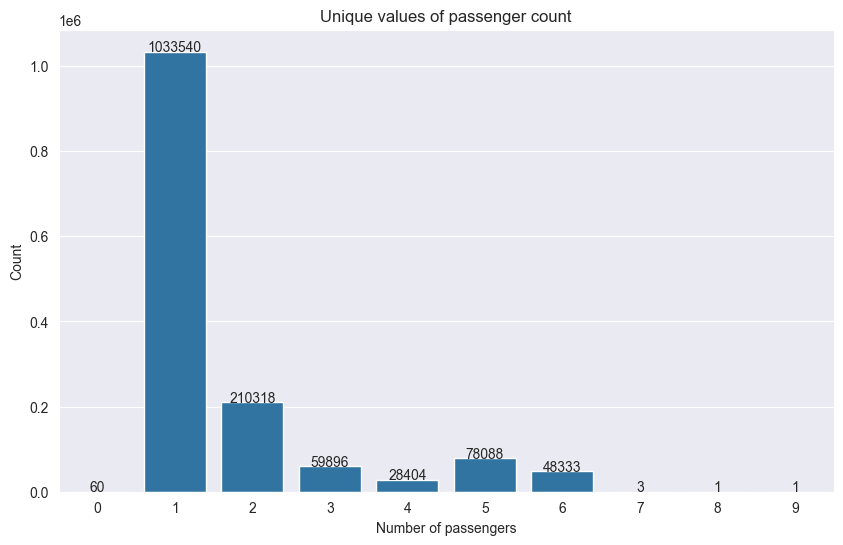

In [154]:
# count the values in passenger_count and plot them
passenger_count = nyc['passenger_count'].value_counts()
# sort the values by index
passenger_count = passenger_count.sort_index()
plt.figure(figsize=(10, 6))
sns.barplot(x=passenger_count.index, y=passenger_count.values)
put_text_on_barplot(plt.gca(), passenger_count.values)

# make the plot horizontal
# set the title and labels
plt.title('Unique values of passenger count')
plt.xlabel('Number of passengers')
plt.ylabel('Count')

Insights: Most trips have 1 or 2 passengers, with a few trips having 3, 4, 5, or 6 passengers. There are trips with 0 passengers, maybe indicating an error in the data, or that a taxi might be carrying goods instead of passengers.
There is very little data for trips with 7 or more passengers, which makes sense given that most taxis can only carry up to 6 passengers.

### Trip Duration Distribution
Lets explore the trip duration distribution, we will use log transformation to better visualize the data.

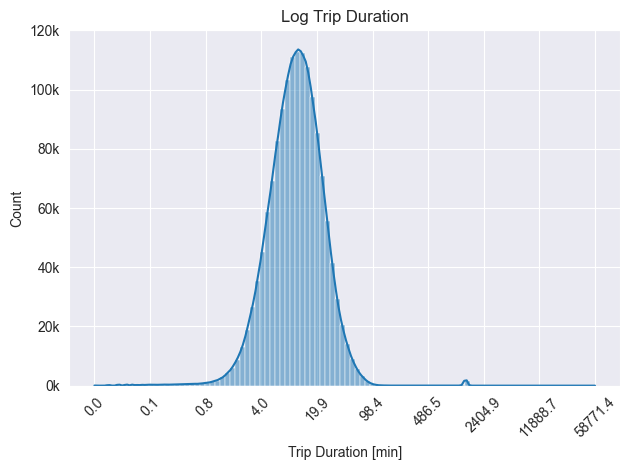

In [155]:
# Apply log to trip duration
nyc['log_trip_duration'] = np.log1p(nyc['trip_duration'])

# Plot the distribution of log trip duration
sns.histplot(nyc['log_trip_duration'], bins=100, kde=True)
plt.title('Log Trip Duration')
# Set the x-axis labels to the original trip duration values
# Generate ticks for the log values
log_ticks = np.linspace(nyc['log_trip_duration'].min(), nyc['log_trip_duration'].max(), num=10)
# Map the log values to the original values
original_ticks = np.expm1(log_ticks)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.xticks(log_ticks, labels=[f'{tick/60:.1f}' for tick in original_ticks])
plt.xlabel('Trip Duration [min]')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Insights: We can see a natural distribution of the trip duration as a log-normal distribution. This is expected, as most trips are short, with a few trips being very long. The log transformation helps to visualize the data better.

### Trip Duration Distribution Per day of the week

In [156]:
avg_trip_duration_per_day = nyc.groupby(nyc['pickup_day_of_week_num'])['trip_duration'].mean().reset_index(name='avg_trip_duration_per_day')
avg_trip_duration_per_day_all = nyc.groupby(nyc['pickup_datetime'].dt.date)['trip_duration'].mean()
avg_trip_duration_per_hour = nyc.groupby(nyc['pickup_hour'])['trip_duration'].mean().reset_index(name='avg_trip_duration_per_hour')

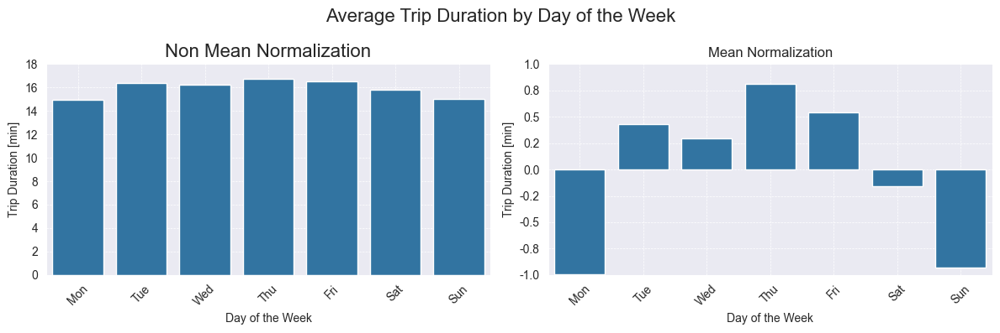

In [157]:
avg_trip_duration_per_day_normalized = (avg_trip_duration_per_day - avg_trip_duration_per_day.mean())/60

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot daily trip frequency
plt.subplot(1, 2, 1)
sns.barplot(x='pickup_day_of_week_num', y='avg_trip_duration_per_day', data=avg_trip_duration_per_day/60, ax=axes[0])
plt.title('Non Mean Normalization', fontsize=16)
plt.xlabel('Day of the Week')
plt.ylabel('Trip Duration [min]')
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{label:.0f}' for label in y_ticks])
plt.xticks([0, 1, 2, 3, 4, 5, 6], ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)
plt.grid(True, linestyle='--', linewidth=0.5)

# Plot daily trip frequency, mean normalized
plt.subplot(1, 2, 2)
sns.barplot(x='pickup_day_of_week_num', y='avg_trip_duration_per_day', data=avg_trip_duration_per_day_normalized, ax=axes[1])
plt.title('Mean Normalization')
plt.xlabel('Day of the Week')
plt.ylabel('Trip Duration [min]')
plt.ylim([-1, 1])
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{label:.1f}' for label in y_ticks])
plt.xticks([0, 1, 2, 3, 4, 5, 6], ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)
plt.grid(True, linestyle='--', linewidth=0.5)
plt.suptitle('Average Trip Duration by Day of the Week', fontsize=16)
plt.tight_layout()
plt.show()

Insights: The average trip duration is increasing from monday to thursday, which mights say that the middle of the week is much busier and there are more traffic jams.
 we can notice a wave pattern, which may point on some of cyclical weekly patterns in the data.

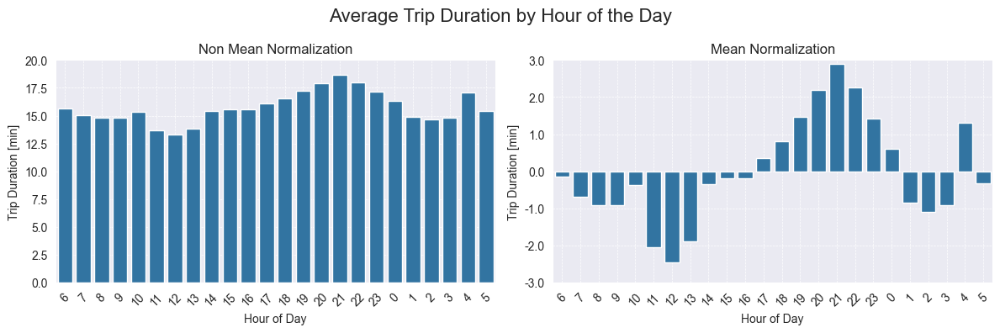

In [158]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

hour_order = list(range(6, 24)) + list(range(0, 6))
avg_trip_duration_per_hour['average_trip_duration_minutes'] = avg_trip_duration_per_hour['avg_trip_duration_per_hour']/60

# Plot hourly trip frequency
plt.subplot(1, 2, 1)
sns.barplot(x='pickup_hour', y='average_trip_duration_minutes', data=avg_trip_duration_per_hour, ax=axes[0])
plt.title('Non Mean Normalization')
plt.xlabel('Hour of Day')
plt.ylabel('Trip Duration [min]')
plt.xticks(ticks=range(len(hour_order)), labels=hour_order)
plt.xticks(rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{label:.1f}' for label in y_ticks])
plt.grid(True, linestyle='--', linewidth=0.5)

# Plot hourly trip frequency mean normalized
avg_trip_duration_per_hour_normalized = hourly_pickup_frequency
avg_trip_duration_per_hour_normalized['avg_trip_duration_per_hour'] = (avg_trip_duration_per_hour['avg_trip_duration_per_hour'] - avg_trip_duration_per_hour['avg_trip_duration_per_hour'].mean())/60
plt.subplot(1, 2, 2)
sns.barplot(x='pickup_hour', y='avg_trip_duration_per_hour', data=avg_trip_duration_per_hour_normalized, ax=axes[1])
plt.title('Mean Normalization')
plt.xlabel('Hour of Day')
plt.ylabel('Trip Duration [min]')
plt.xticks(ticks=range(len(hour_order)), labels=hour_order)
plt.xticks(rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{label:.1f}' for label in y_ticks])
plt.ylim([-3, 3])
plt.grid(True, linestyle='--', linewidth=0.5)
plt.suptitle('Average Trip Duration by Hour of the Day', fontsize=16)
plt.tight_layout()
plt.show()

Insights: The average trip duration is higher in the afternoon hours, indicating that trips in the afternoon tend to be longer due to traffic jams from people that finished working. In constrast the average trip duration in the early noon is the lowest, which might be due to less traffic because people are at work.

#### FFT Analysis of Trip Duration by Days of the Week

In [159]:
avg_trip_duration_per_day_np = avg_trip_duration_per_day['avg_trip_duration_per_day'].values
avg_trip_duration_per_hour_np = avg_trip_duration_per_hour['avg_trip_duration_per_hour'].values

avg_trip_duration_per_day_np = avg_trip_duration_per_day_np - avg_trip_duration_per_day_np.mean()
avg_trip_duration_per_hour_np = avg_trip_duration_per_hour_np - avg_trip_duration_per_hour_np.mean()

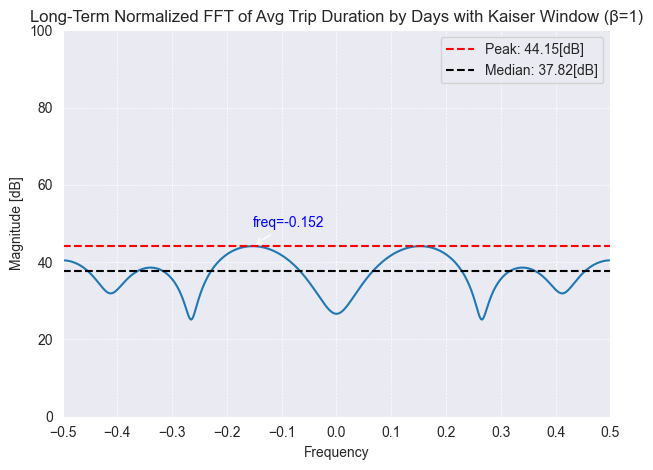

In [160]:

daily_trip_counts_np = avg_trip_duration_per_day_all.values 

# Apply Kaiser window
window = np.kaiser(len(avg_trip_duration_per_day_np), beta=1)
windowed_data = avg_trip_duration_per_day_np * window

# Zero-pad
zero_padded_data = np.pad(windowed_data, (0, 512 - len(windowed_data)), 'constant')

# Compute FFT
fft_values = np.fft.fft(zero_padded_data)
fft_frequencies = np.fft.fftfreq(len(fft_values))
fft_magnitude_db = 20 * np.log10(np.abs(fft_values))

# Find the peak
peak_indices_by_magnitude = np.argsort(fft_magnitude_db)[::-1] 
second_peak_index = peak_indices_by_magnitude[0]  # Second peak (not the DC)
second_peak_magnitude = fft_magnitude_db[second_peak_index]
highest_peak_frequency = fft_frequencies[second_peak_index]
median_index = peak_indices_by_magnitude[len(peak_indices_by_magnitude)//2]
median_magnitude = fft_magnitude_db[median_index]

# Plot FFT
plt.plot(np.fft.fftshift(np.fft.fftfreq(fft_frequencies.shape[-1])), np.fft.fftshift(fft_magnitude_db))
# Plot the peak and median lines
plt.axhline(y=second_peak_magnitude, color='red', linestyle='--', label=f'Peak: {second_peak_magnitude:.2f}[dB]')
plt.axhline(y=median_magnitude, color='black', linestyle='--', label=f'Median: {median_magnitude:.2f}[dB]')
plt.annotate(f'freq={highest_peak_frequency:.3f}', 
             xy=(highest_peak_frequency, fft_magnitude_db[second_peak_index]), 
             xytext=(highest_peak_frequency, fft_magnitude_db[second_peak_index] + 5),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             fontsize=10, color='blue')
plt.title('Long-Term Normalized FFT of Avg Trip Duration by Days with Kaiser Window (β=1)')
plt.xlabel('Frequency')
plt.ylabel('Magnitude [dB]')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xlim([-0.5, 0.5])
plt.ylim([0, 100])
plt.xticks(np.arange(-0.5, 0.6, 0.1))
plt.legend()
plt.tight_layout()
plt.show()

FFT interpretation: We get a strong frequency component at about 0.152 Hz, which corresponds to a period of about 6.6 days. This indicates a weekly pattern in the data, which is consistent with the bar plot we saw earlier. The peak frequency is at 0.152 Hz, which corresponds to a period of about 6.6 days, indicating a weekly pattern in the data.

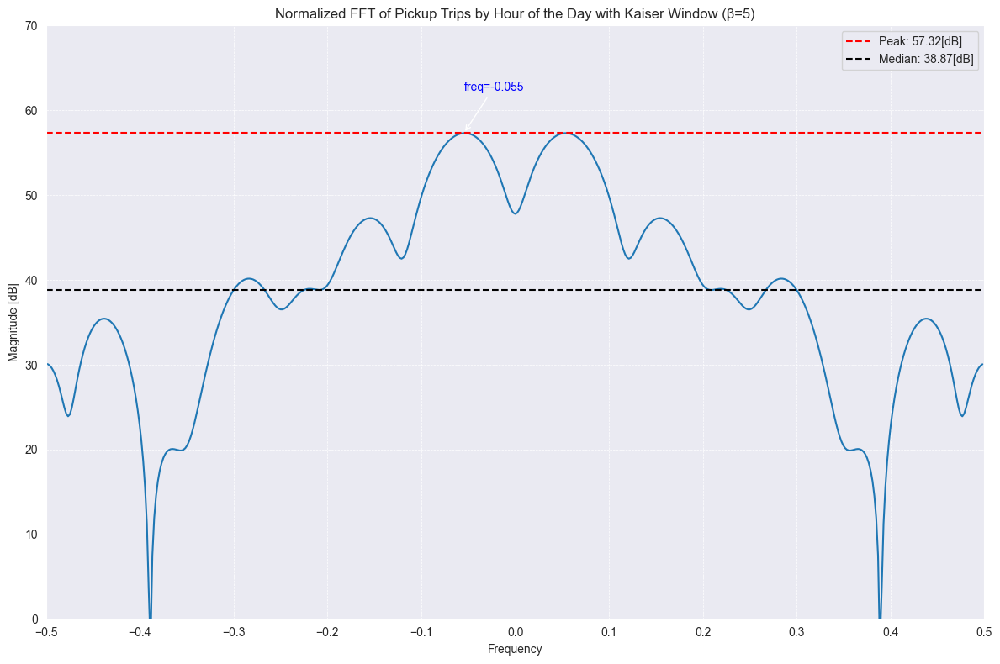

In [162]:

# Apply Kaiser window
window = np.kaiser(len(avg_trip_duration_per_hour_np), beta=5)
windowed_data = avg_trip_duration_per_hour_np * window

# Zero-pad
zero_padded_data = np.pad(windowed_data, (0, 512 - len(windowed_data)), 'constant')

fft_values = np.fft.fft(zero_padded_data)
fft_frequencies = np.fft.fftfreq(len(fft_values))
# Get magnitude for positive frequencies only (its symetric)
# fft_magnitude_db = 20 * np.log10(np.abs(fft_values[:len(fft_values)//2]))
fft_magnitude_db = 20 * np.log10(np.abs(fft_values))

# Find the peak
peak_indices_by_magnitude = np.argsort(fft_magnitude_db)[::-1] 
second_peak_index = peak_indices_by_magnitude[0]
second_peak_magnitude = fft_magnitude_db[second_peak_index]
highest_peak_frequency = fft_frequencies[second_peak_index]
median_index = peak_indices_by_magnitude[len(peak_indices_by_magnitude)//2]
median_magnitude = fft_magnitude_db[median_index]

# Plot FFT
plt.figure(figsize=(12,8))
plt.plot(np.fft.fftshift(np.fft.fftfreq(fft_frequencies.shape[-1])), np.fft.fftshift(fft_magnitude_db))
# Plot the peak and median lines
plt.axhline(y=second_peak_magnitude, color='red', linestyle='--', label=f'Peak: {second_peak_magnitude:.2f}[dB]')
plt.axhline(y=median_magnitude, color='black', linestyle='--', label=f'Median: {median_magnitude:.2f}[dB]')
plt.annotate(f'freq={highest_peak_frequency:.3f}', 
             xy=(highest_peak_frequency, fft_magnitude_db[second_peak_index]), 
             xytext=(highest_peak_frequency, fft_magnitude_db[second_peak_index] + 5),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             fontsize=10, color='blue')
plt.title('Normalized FFT of Pickup Trips by Hour of the Day with Kaiser Window (β=5)')
plt.xlabel('Frequency')
plt.ylabel('Magnitude [dB]')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xlim([-0.5, 0.5])
plt.ylim([0, 70])
plt.xticks(np.arange(-0.5, 0.6, 0.1))
plt.legend()
plt.tight_layout()
plt.show()

FFT interpretation: We get a strong frequency component at about 0.055 Hz, which corresponds to a period of about 18 hours. This indicates a working day pattern in the data.

### Pickup and Dropoff Locations

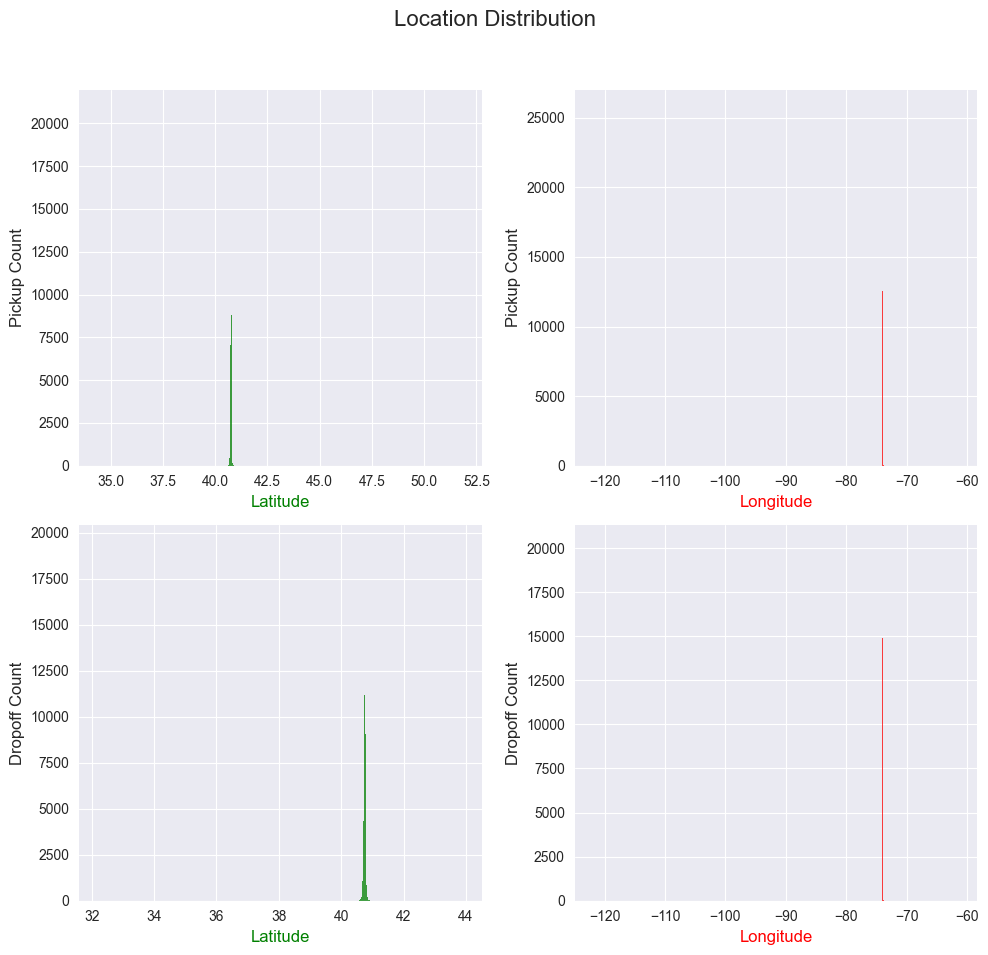

In [163]:
import seaborn as sns
import matplotlib.pyplot as plt

f, axes = plt.subplots(2, 2, figsize=(10, 10))

sns.histplot(nyc['pickup_latitude'], ax=axes[0, 0], color='green')
sns.histplot(nyc['pickup_longitude'], ax=axes[0, 1], color='red')
sns.histplot(nyc['dropoff_latitude'], ax=axes[1, 0], color='green')
sns.histplot(nyc['dropoff_longitude'], ax=axes[1, 1], color='red')

axes[0, 0].set_ylabel('Pickup Count', fontsize=12)
axes[1, 0].set_ylabel('Dropoff Count', fontsize=12)
axes[1, 1].set_ylabel('Dropoff Count', fontsize=12)
axes[0, 1].set_ylabel('Pickup Count', fontsize=12)
axes[1, 0].set_xlabel('Latitude', fontsize=12, color='green')
axes[1, 1].set_xlabel('Longitude', fontsize=12, color='red')
axes[0, 0].set_xlabel('Latitude', fontsize=12, color='green')
axes[0, 1].set_xlabel('Longitude', fontsize=12, color='red')

f.suptitle('Location Distribution', fontsize=16)

# Adjust layout to prevent overlapping
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

sns.despine(left=True, fig=f)

plt.show()


Insights: The distribution of the pickup and dropoff locations are very spikey, it hard to see the distribution of the data, but this is an expected result since most of the trips are concentrated in a few areas of the city, and there very few trips that are far away from the city center. We will filter this outliers for visualization purposes.

In [164]:
# remove the outliers using 3-sigma rule
pick_lat_mean = nyc['pickup_latitude'].mean()
pick_lat_std = nyc['pickup_latitude'].std()
pick_lon_mean = nyc['pickup_longitude'].mean()
pick_lon_std = nyc['pickup_longitude'].std()

drop_lat_mean = nyc['dropoff_latitude'].mean()
drop_lat_std = nyc['dropoff_latitude'].std()
drop_lon_mean = nyc['dropoff_longitude'].mean()
drop_lon_std = nyc['dropoff_longitude'].std()

nyc_filtered = nyc[
    (nyc['pickup_latitude'] > pick_lat_mean - 2 * pick_lat_std) &
    (nyc['pickup_latitude'] < pick_lat_mean + 2 * pick_lat_std) &
    (nyc['pickup_longitude'] > pick_lon_mean - 2 * pick_lon_std) &
    (nyc['pickup_longitude'] < pick_lon_mean + 2 * pick_lon_std) &
    (nyc['dropoff_latitude'] > drop_lat_mean - 2 * drop_lat_std) &
    (nyc['dropoff_latitude'] < drop_lat_mean + 2 * drop_lat_std) &
    (nyc['dropoff_longitude'] > drop_lon_mean - 2 * drop_lon_std) &
    (nyc['dropoff_longitude'] < drop_lon_mean + 2 * drop_lon_std)
]

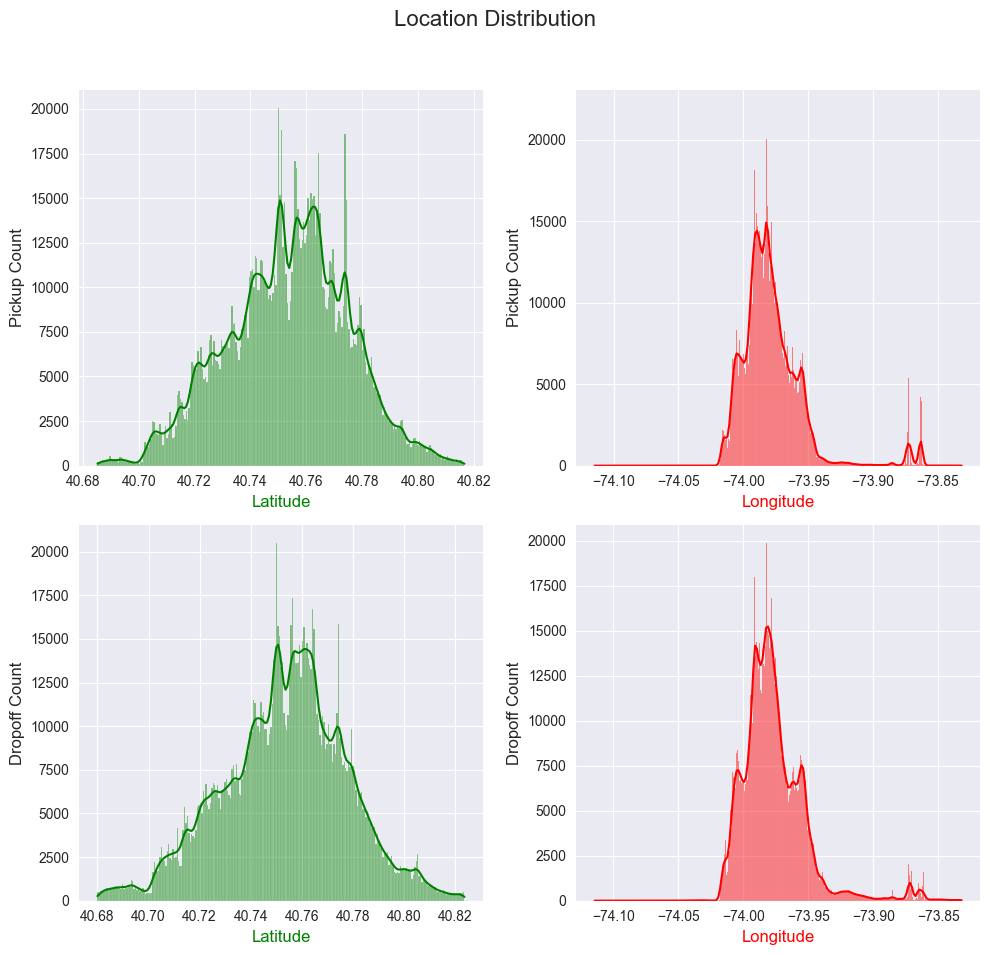

In [165]:
f, axes = plt.subplots(2, 2, figsize=(10, 10))

sns.histplot(nyc_filtered['pickup_latitude'], ax=axes[0, 0], kde=True, color='green')
sns.histplot(nyc_filtered['pickup_longitude'], ax=axes[0, 1], kde=True, color='red')

sns.histplot(nyc_filtered['dropoff_latitude'], ax=axes[1, 0], kde=True, color='green')
sns.histplot(nyc_filtered['dropoff_longitude'], ax=axes[1, 1], kde=True, color='red')

axes[0, 0].set_ylabel('Pickup Count', fontsize=12)
axes[1, 0].set_ylabel('Dropoff Count', fontsize=12)
axes[1, 1].set_ylabel('Dropoff Count', fontsize=12)
axes[0, 1].set_ylabel('Pickup Count', fontsize=12)
axes[1, 0].set_xlabel('Latitude', fontsize=12, color='green')
axes[1, 1].set_xlabel('Longitude', fontsize=12, color='red')
axes[0, 0].set_xlabel('Latitude', fontsize=12, color='green')
axes[0, 1].set_xlabel('Longitude', fontsize=12, color='red')


axes[0, 0].xlim = (pick_lat_mean - 2 * pick_lat_std, pick_lat_mean + 2 * pick_lat_std)
axes[0, 1].xlim = (pick_lon_mean - 2 * pick_lon_std, pick_lon_mean + 2 * pick_lon_std)
axes[1, 0].xlim = (drop_lat_mean - 2 * drop_lat_std, drop_lat_mean + 2 * drop_lat_std)
axes[1, 1].xlim = (drop_lon_mean - 2 * drop_lon_std, drop_lon_mean + 2 * drop_lon_std)

f.suptitle('Location Distribution', fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
sns.despine(left=True, fig=f)
plt.show()


Insights: Now its much clearer, we can see that the pickup and dropoff locations are concentrated in a few areas of the city, with the majority of trips happening in these areas. This is expected, as most people tend to travel within the city or to nearby areas.

#### Trip Duration vs Passenger Count vs Vendor ID

Lets plot the trip duration vs passenger count with the hue of vendor id.

We will use filtered data to get better visualization.
Starting by filtering by trip duration, we will remove the outliers passing the 975 quantile and passenger count greater than 6 or less than 1.

In [171]:
nyc_filtered = nyc_filtered[nyc_filtered['trip_duration'] < nyc_filtered['trip_duration'].quantile(0.975)]
nyc_filtered = nyc_filtered[(nyc_filtered['passenger_count'] > 0) & (nyc_filtered['passenger_count'] < 7)]

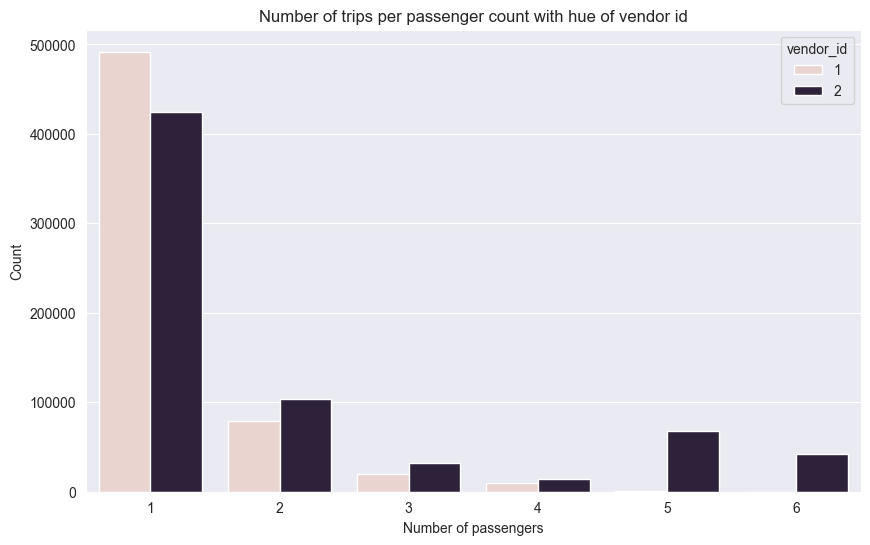

In [172]:
# make a barplot of passenger count with hue of vendor id
plt.figure(figsize=(10, 6))
sns.countplot(x='passenger_count', hue='vendor_id', data=nyc_filtered)
plt.title('Number of trips per passenger count with hue of vendor id')
plt.xlabel('Number of passengers')
plt.ylabel('Count')
plt.show()

Insights: Most trips have 1 or 2 passengers, with vendor 2 having more trips with 2 passengers than vendor 1. Vendor 1 has more trips with 1 passenger than vendor 2. The number of trips with 3, 4, 5, or 6 passengers is very low for both vendors, but vendor 2 tend to take bigger groups of passengers.

### Filtering the NYC Taxi Dataset

Two reasonable filtering that we need to do is to remove those trip with 0, 7 or more passengers since, its only 65 trips, they doesnt really add any value to the dataset, the other one is removing trips longer than 24 hours

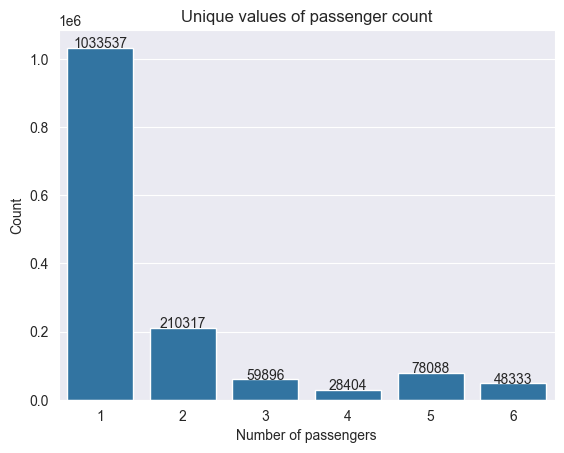

In [173]:
nyc = nyc[nyc['passenger_count'] > 0]
nyc = nyc[nyc['passenger_count'] < 7]

passenger_count = nyc['passenger_count'].value_counts()

passenger_count = passenger_count.sort_index()
sns.barplot(x=passenger_count.index, y=passenger_count.values)
put_text_on_barplot(plt.gca(), passenger_count.values)
plt.title('Unique values of passenger count')
plt.xlabel('Number of passengers')
plt.ylabel('Count')
plt.show()

In [174]:
nyc = nyc[nyc['trip_duration'] < 24 * 3600]

### Trips count distribution by day, month and hour

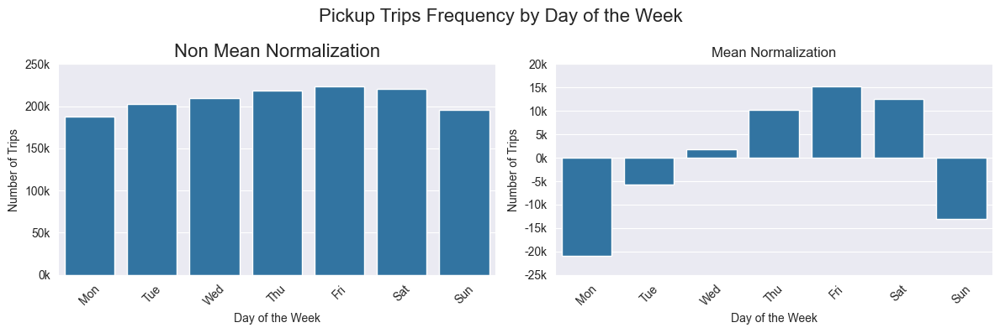

In [176]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot daily trip frequency
plt.subplot(1, 2, 1)
sns.barplot(x='pickup_day_of_week_num', y='daily_pickup_frequency', data=daily_pickup_frequency, ax=axes[0])
plt.title('Non Mean Normalization', fontsize=16)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Trips')
plt.xticks([0, 1, 2, 3, 4, 5, 6], ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
# plt.grid(True, linestyle='--', linewidth=0.5)

# Plot daily trip frequency, mean normalized
daily_pickup_frequency_normalized = daily_pickup_frequency - daily_pickup_frequency.mean()

plt.subplot(1, 2, 2)
sns.barplot(x='pickup_day_of_week_num', y='daily_pickup_frequency', data=daily_pickup_frequency_normalized, ax=axes[1])
plt.title('Mean Normalization')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Trips')
plt.xticks([0, 1, 2, 3, 4, 5, 6], ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
# plt.grid(True, linestyle='--', linewidth=0.5)

plt.suptitle('Pickup Trips Frequency by Day of the Week', fontsize=16)
plt.tight_layout()
plt.show()

Insights: The distribution of trips across the days of the week is relatively consistent, zooming in on the number of trips per day of the week shows that the number of trips is slightly higher on Thursday and Friday, and slightly lower on Sunday. We also see a wave pattern, which may indicate some cyclical weekly patterns in the data.

FFT interpretation: As we can see, there is strong DC component in the non normalized signal.<br>
However, after subtracting the mean, we can see some uncomplete sin signal.

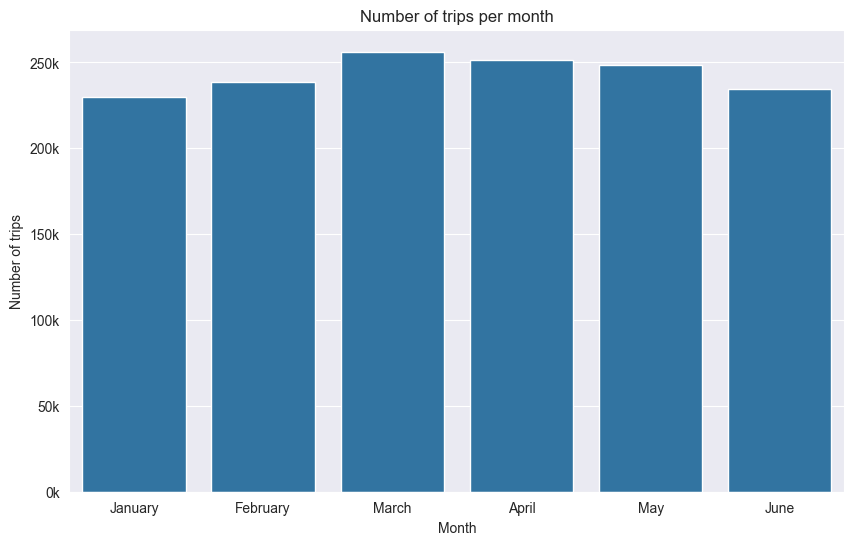

In [177]:
# make a bar plot using sns of the number of trips per month
plt.figure(figsize=(10, 6))
sns.countplot(x='month', data=nyc, order=['January', 'February', 'March', 'April', 'May', 'June'])
values_per_month = nyc['month'].value_counts()[month_order]
plt.xlabel('Month')
plt.ylabel('Number of trips')
plt.title('Number of trips per month')
# set ytick to hundreds of thousands, example 100k . in jumping of 50k till 300k
plt.yticks(ticks=np.arange(0, 300000, step=50000), labels=[f'{int(tick / 1000)}k' for tick in np.arange(0, 300000, step=50000)])
plt.show()

Insights: The number of trips is consistent across the months, with a slight increase in the number of trips in March and April. This could be due to the weather conditions or other factors that influence travel patterns.

182


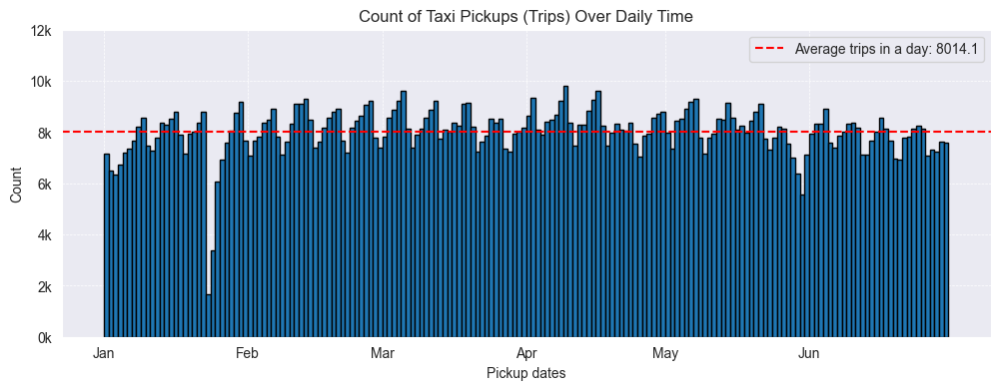

In [178]:
# Convert the 'pickup_datetime' column to datetime
nyc = nyc.sort_values(by='pickup_datetime')

# Count unique dates
unique_dates_count = nyc['pickup_datetime'].dt.date.nunique()

min_date = nyc['pickup_datetime'].min()
max_date = nyc['pickup_datetime'].max()
num_days = (max_date - min_date).days + 1  # Calculate number of days
print(num_days)

daily_trip_counts = nyc.groupby(nyc['pickup_datetime'].dt.date).size()
daily_trip_counts_np = daily_trip_counts.values  
daily_trip_counts_mean = daily_trip_counts_np.mean()

plt.figure(figsize=(12, 4))
plt.hist(nyc['pickup_datetime'], bins=182, edgecolor = "black")
plt.axhline(y=daily_trip_counts_mean, color='red', linestyle='--', label=f'Average trips in a day: {daily_trip_counts_mean:.1f}')

plt.title('Count of Taxi Pickups (Trips) Over Daily Time')
plt.xlabel('Pickup dates')
plt.ylabel('Count')
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.xticks(pd.date_range(start=min_date, end=max_date, freq='MS'), 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun'])
plt.legend()
plt.show()

Insights: As we can see, except a few days in January and May, almost all days are fluctuating around the same mean (DC) level.

However, we also can see some weekly pattern - 4 steps in each month. 

Lets zoom in and try to see it better

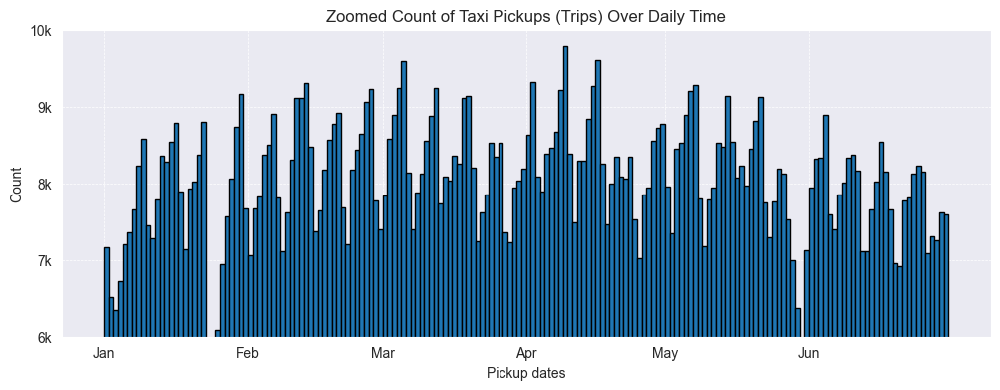

In [179]:
plt.figure(figsize=(12, 4))
plt.hist(nyc['pickup_datetime'], bins=182, edgecolor = "black")
plt.title('Zoomed Count of Taxi Pickups (Trips) Over Daily Time')
plt.xlabel('Pickup dates')
plt.ylabel('Count')
plt.ylim([6000, 10000])
ax = plt.gca()
# y_ticks = ax.get_yticks()
y_ticks = [6000, 7000, 8000, 9000, 10000]
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.xticks(pd.date_range(start=min_date, end=max_date, freq='MS'), 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun'])
plt.show()

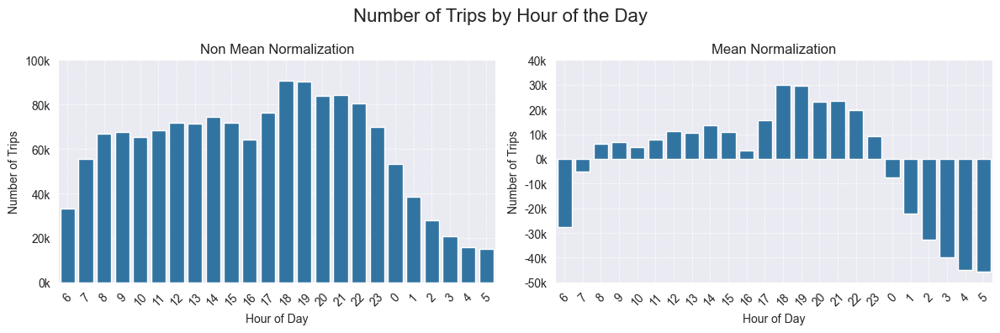

In [180]:
hour_order = list(range(6, 24)) + list(range(0, 6))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot hourly trip frequency
plt.subplot(1, 2, 1)
sns.barplot(x='pickup_hour', y='hourly_pickup_frequency', data=hourly_pickup_frequency, order=hour_order, ax=axes[0])
plt.title('Non Mean Normalization')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(ticks=range(len(hour_order)), labels=hour_order)
plt.xticks(rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.grid(True, linestyle='--', linewidth=0.5)

# Plot hourly trip frequency mean normalized
hourly_pickup_frequency_normalized = hourly_pickup_frequency.copy()
hourly_pickup_frequency_normalized['hourly_pickup_frequency'] = hourly_pickup_frequency['hourly_pickup_frequency'] - hourly_pickup_frequency['hourly_pickup_frequency'].mean()

plt.subplot(1, 2, 2)
sns.barplot(x='pickup_hour', y='hourly_pickup_frequency', data=hourly_pickup_frequency_normalized, order=hour_order, ax=axes[1])
plt.title('Mean Normalization')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(ticks=range(len(hour_order)), labels=hour_order)
plt.xticks(rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.grid(True, linestyle='--', linewidth=0.5)

plt.suptitle('Number of Trips by Hour of the Day', fontsize=16)
plt.tight_layout()
plt.show()

Insights: This is more fine-grained view of the number of trips per hour, showing the distribution of trips throughout the day. The number of trips is lowest between 2 AM to 7 AM, Then increasing during the day where the peak is between 6 PM to 8 PM.

FFT interpretation: As we can see, here there is still DC component, but he is weak compared to the days of the week.
However, after subtracting the mean, we can see some sin signal again.

### FFT Analysis of Pickup Trips by Days and Hours

Lets look at the fft of both days and hours

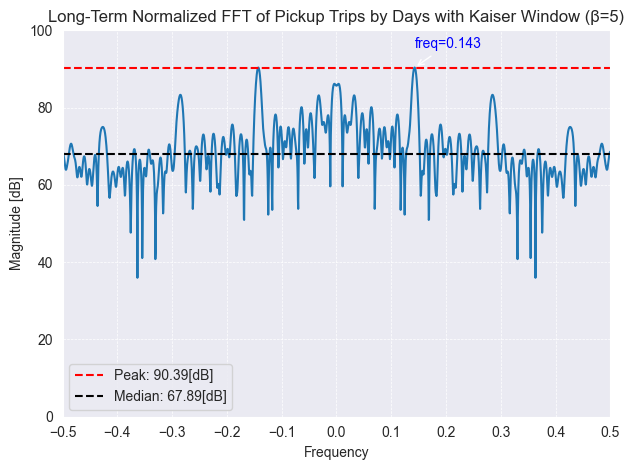

In [181]:
import numpy as np
import matplotlib.pyplot as plt

daily_trip_counts = nyc.groupby(nyc['pickup_datetime'].dt.date).size()
daily_trip_counts_np = daily_trip_counts.values 
daily_trip_counts_np = daily_trip_counts_np - daily_trip_counts_np.mean()  # Remove mean (DC)

# Apply Kaiser window with beta=5
window = np.kaiser(len(daily_trip_counts_np), beta=5)
windowed_data = daily_trip_counts_np * window

# Zero-pad to 2048 length
zero_padded_data = np.pad(windowed_data, (0, 2048 - len(windowed_data)), 'constant')

# Compute FFT
fft_values = np.fft.fft(zero_padded_data)
fft_frequencies = np.fft.fftfreq(len(fft_values))
fft_magnitude_db = 20 * np.log10(np.abs(fft_values))

# Find the peak
peak_indices_by_magnitude = np.argsort(fft_magnitude_db)[::-1] 
second_peak_index = peak_indices_by_magnitude[0]  # Second peak (not the DC)
second_peak_magnitude = fft_magnitude_db[second_peak_index]
highest_peak_frequency = fft_frequencies[second_peak_index]
median_index = peak_indices_by_magnitude[len(peak_indices_by_magnitude)//2]
median_magnitude = fft_magnitude_db[median_index]

# Plot FFT
plt.plot(np.fft.fftshift(np.fft.fftfreq(fft_frequencies.shape[-1])), np.fft.fftshift(fft_magnitude_db))
# Plot the peak and median lines
plt.axhline(y=second_peak_magnitude, color='red', linestyle='--', label=f'Peak: {second_peak_magnitude:.2f}[dB]')
plt.axhline(y=median_magnitude, color='black', linestyle='--', label=f'Median: {median_magnitude:.2f}[dB]')

plt.annotate(f'freq={highest_peak_frequency:.3f}', 
             xy=(highest_peak_frequency, fft_magnitude_db[second_peak_index]), 
             xytext=(highest_peak_frequency, fft_magnitude_db[second_peak_index] + 5),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             fontsize=10, color='blue')
plt.title('Long-Term Normalized FFT of Pickup Trips by Days with Kaiser Window (β=5)')
plt.xlabel('Frequency')
plt.ylabel('Magnitude [dB]')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xlim([-0.5, 0.5])
plt.ylim([0, 100])
plt.xticks(np.arange(-0.5, 0.6, 0.1))
plt.legend()
plt.tight_layout()
plt.show()


We get another strong frequency component at about 0.14, which make sense:<br>
&emsp;T = 1 / Frequency = 1 / 0.14 = 7.14 days.<br>
&emsp;So, we get that there is weekly cycle meaning that the number of trips varies significantly across different days of the week.<br>
&emsp;This could indicate that weekends or specific weekdays see more trips.

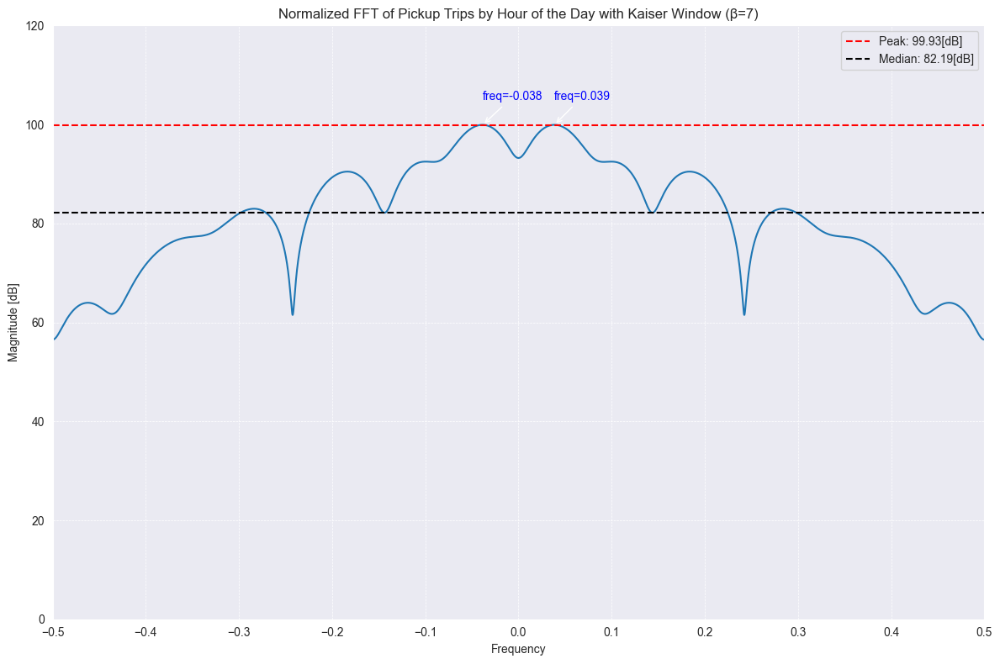

In [182]:

hourly_trip_counts = nyc.groupby(nyc['pickup_datetime'].dt.hour).size()
hourly_trip_counts_np = hourly_trip_counts.values
hourly_trip_counts_np = hourly_trip_counts_np - hourly_trip_counts_np.mean()


# Apply Kaiser window
window = np.kaiser(len(hourly_trip_counts_np), beta=7)
windowed_data = hourly_trip_counts_np * window

# Zero-pad to 2048 length for short. Use 8192 for long.
zero_padded_data = np.pad(windowed_data, (0, 8192 - len(windowed_data)), 'constant')

fft_values = np.fft.fft(zero_padded_data)
fft_frequencies = np.fft.fftfreq(len(fft_values))

fft_magnitude_db = 20 * np.log10(np.abs(fft_values))

# Find the peak 
peak_indices_by_magnitude = np.argsort(fft_magnitude_db)[::-1] 
second_peak_index = peak_indices_by_magnitude[0]
second_peak_index2 = peak_indices_by_magnitude[8]
second_peak_magnitude = fft_magnitude_db[second_peak_index]
highest_peak_frequency = fft_frequencies[second_peak_index]
highest_peak_frequency2 = fft_frequencies[second_peak_index2]
median_index = peak_indices_by_magnitude[len(peak_indices_by_magnitude)//2]
median_magnitude = fft_magnitude_db[median_index]

# Plot FFT
plt.figure(figsize=(12,8))
plt.plot(np.fft.fftshift(np.fft.fftfreq(fft_frequencies.shape[-1])), np.fft.fftshift(fft_magnitude_db))
# Plot the peak and median lines
plt.axhline(y=second_peak_magnitude, color='red', linestyle='--', label=f'Peak: {second_peak_magnitude:.2f}[dB]')
plt.axhline(y=median_magnitude, color='black', linestyle='--', label=f'Median: {median_magnitude:.2f}[dB]')

plt.annotate(f'freq={highest_peak_frequency:.3f}', 
             xy=(highest_peak_frequency, fft_magnitude_db[second_peak_index]), 
             xytext=(highest_peak_frequency, fft_magnitude_db[second_peak_index] + 5),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             fontsize=10, color='blue')
plt.annotate(f'freq={highest_peak_frequency2:.3f}', 
             xy=(highest_peak_frequency2, fft_magnitude_db[second_peak_index2]), 
             xytext=(highest_peak_frequency2, fft_magnitude_db[second_peak_index2] + 5),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             fontsize=10, color='blue')
plt.title('Normalized FFT of Pickup Trips by Hour of the Day with Kaiser Window (β=7)')
plt.xlabel('Frequency')
plt.ylabel('Magnitude [dB]')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xlim([-0.5, 0.5])
plt.ylim([0, 120])
plt.xticks(np.arange(-0.5, 0.6, 0.1))
plt.legend()
plt.tight_layout()
plt.show()


We can see no strong hourly periodic pattern (like a daily cycle).  That fits the graph of trips by hour which are relatively uniform over different hours of the day, besides fewer trips during the late night.

### Trip Duration vs Pickup Day of the Week vs Vendor ID

Here we will also used the filtered data for better visualization.

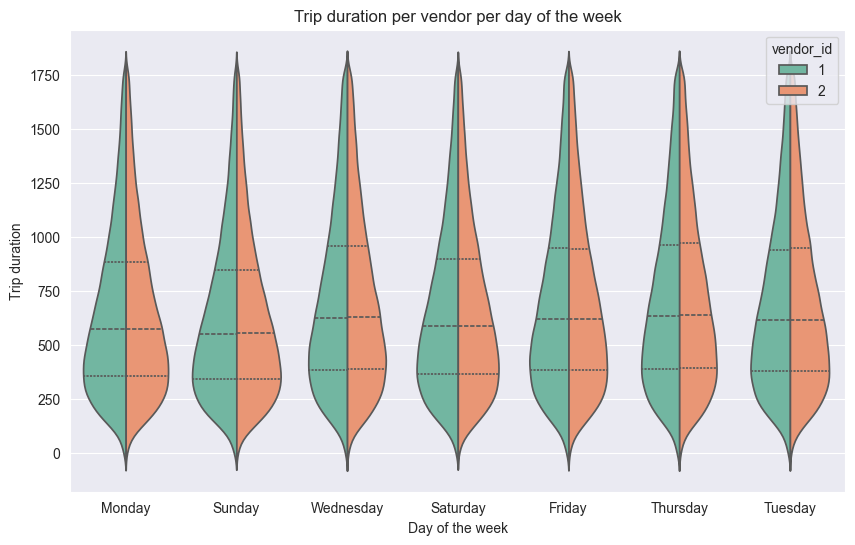

In [183]:
nyc_filtered['pickup_day_of_week'] = pd.to_datetime(nyc_filtered['pickup_datetime']).dt.day_name()
mean_duration_per_vendor_per_day = nyc_filtered.groupby(['vendor_id', 'pickup_day_of_week'])['trip_duration'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.violinplot(x='pickup_day_of_week', y='trip_duration', hue='vendor_id', data=nyc_filtered, split=True, inner='quartile', palette='Set2')
plt.title('Trip duration per vendor per day of the week')
plt.xlabel('Day of the week')
plt.ylabel('Trip duration')
plt.show()

Insights: After filtering the data, we can see that the mean trip duration is consistent across the days of the week for both vendors, with vendor 2 having slightly longer trips than vendor 1. We already seen that vendor 2 tends to have longer trips than vendor 1, the filtering of the data reduced the variance between them, so we need to take this plot into account carefully.

### Feature Engineering on the NYC Taxi Dataset

We would like to add some features to the dataset like having the distance between the pickup and dropoff locations, and the manhattan distance between them.

In [184]:
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371.0
    lat1, lon1, lat2, lon2 = np.radians(lat1), np.radians(lon1), np.radians(lat2), np.radians(lon2)
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c * 1000

def manhattan_distance(pickup_latitude, pickup_longitude, dropoff_latitude, dropoff_longitude):
    """
    Calculate Manhattan distance in meters between two geographic points.
    
    Parameters:
    pickup_latitude (float or pandas.Series): Latitude of the pickup location.
    pickup_longitude (float or pandas.Series): Longitude of the pickup location.
    dropoff_latitude (float or pandas.Series): Latitude of the dropoff location.
    dropoff_longitude (float or pandas.Series): Longitude of the dropoff location.
    
    Returns:
    float or pandas.Series: The Manhattan distance in meters.
    """
    # Approximate radius of the Earth in meters
    R = 6378137.0
    
    # Convert degrees to radians
    pickup_lat_rad = np.radians(pickup_latitude)
    dropoff_lat_rad = np.radians(dropoff_latitude)
    
    # Latitude and longitude differences
    delta_lat = np.radians(np.abs(dropoff_latitude - pickup_latitude))
    delta_lon = np.radians(np.abs(dropoff_longitude - pickup_longitude))
    
    # Calculate distance along each axis (north-south and east-west)
    lat_dist = R * delta_lat
    lon_dist = R * np.cos((pickup_lat_rad + dropoff_lat_rad) / 2) * delta_lon
    
    # Return Manhattan distance as the sum of the latitudinal and longitudinal distances
    manhattan_dist = lat_dist + lon_dist
    return manhattan_dist

In [185]:
nyc['haversine_distance'] = haversine_distance(nyc['pickup_latitude'], nyc['pickup_longitude'], nyc['dropoff_latitude'], nyc['dropoff_longitude'])

nyc['manhattan_distance'] = manhattan_distance(nyc['pickup_latitude'], nyc['pickup_longitude'], nyc['dropoff_latitude'], nyc['dropoff_longitude'])

Text(0.5, 0, 'Distance in meters')

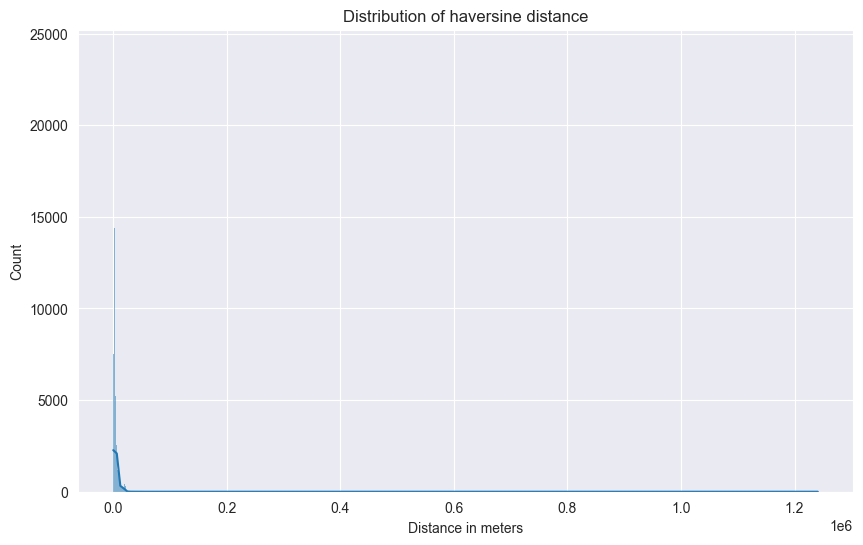

In [186]:
# create a plot of distribution of km
plt.figure(figsize=(10, 6))
sns.histplot(nyc['haversine_distance'], kde=True)
plt.title('Distribution of haversine distance')
plt.xlabel('Distance in meters')